# Team Members - Rudra Patil, Shruti Pangare, Shubham Naik

# DL Project 3: Adversarial Attacks on ResNet-34
This notebook evaluates and attacks an ImageNet-trained ResNet-34 model using FGSM, PGD, Momentum PGD, and Targeted PGD.

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.models import ResNet34_Weights
import requests
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
from PIL import Image
from torch.utils.data import Dataset
import json
import zipfile

In [2]:
# Set seeds for reproducibility
torch.manual_seed(10)
np.random.seed(10)

# Use GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Paths
zip_path = "/content/TestDataSet.zip"
extract_path = "/content/TestDataSet"

# Unzip if not already extracted
if not os.path.exists(extract_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)

print("Dataset extracted successfully.")

Dataset extracted successfully.


## TASK 1 & 2

In [3]:
def load_pretrained_resnet():
    # Loads a pretrained ResNet-34 model with ImageNet-1K weights
    # Moves it to the appropriate device and sets it to evaluation mode
    print("Loading ResNet-34...")
    weights = ResNet34_Weights.IMAGENET1K_V1
    model = torchvision.models.resnet34(weights=weights).to(device).eval()
    return model


def compute_input_range(mean_vals, std_vals):
    # Computes the minimum and maximum normalized pixel values allowed
    # This is used to clamp adversarial perturbations within valid input range
    mean_tensor = torch.tensor(mean_vals, device=device)
    std_tensor = torch.tensor(std_vals, device=device)
    PIXEL_MIN = ((0.0 - mean_tensor) / std_tensor).view(3, 1, 1)
    PIXEL_MAX = ((1.0 - mean_tensor) / std_tensor).view(3, 1, 1)
    return PIXEL_MIN, PIXEL_MAX


def get_transforms(mean_vals, std_vals):
    # Returns a standard preprocessing pipeline for ImageNet evaluation
    # Includes resizing, center cropping, tensor conversion, and normalization
    return transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean_vals, std_vals)
    ])

In [4]:
def load_and_remap_dataset(base_path, transform_pipe):
    # Resolve dataset path: handles both zipped and direct directory structure
    potential_path = os.path.join(base_path, "TestDataSet")
    resolved_path = potential_path if os.path.isdir(potential_path) else base_path

    # Load dataset using torchvision's ImageFolder and specified transforms
    dataset = torchvision.datasets.ImageFolder(root=resolved_path, transform=transform_pipe)
    print(f"Loaded {len(dataset)} images across {len(dataset.classes)} folders.")

    # Download ImageNet synset-to-index mapping if not already present
    index_json = "/content/labels_list.json"
    if not os.path.isfile(index_json):
        print("Downloading class index mapping...")
        json_url = ("https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json")
        response = requests.get(json_url, timeout=10)
        response.raise_for_status()
        with open(index_json, "wb") as f:
            f.write(response.content)

    # Load mapping: {class_index: [synset_id, human_readable_label]}
    with open(index_json) as f:
        imagenet_mapping = json.load(f)

    # Build a mapping from class folder names (synsets) to official ImageNet indices
    syn_to_idx = {val[0]: int(key) for key, val in imagenet_mapping.items()}
    label_index_map = {cls: syn_to_idx[cls] for cls in dataset.classes}
    dataset.class_to_idx = label_index_map  # Overwrite default class indices

    # Update image-label pairs with remapped labels
    remapped_samples = []
    for img_path, _ in dataset.samples:
        syn = os.path.basename(os.path.dirname(img_path))
        remapped_samples.append((img_path, label_index_map[syn]))

    dataset.samples = remapped_samples
    dataset.imgs = remapped_samples  # for compatibility with older torchvision versions
    dataset.targets = [lbl for _, lbl in remapped_samples]

    return dataset, label_index_map, resolved_path, imagenet_mapping


In [5]:
def load_human_readable_labels(path_to_dataset, label_index_map, imagenet_mapping):
    # Construct path to labels_list.json (custom mapping from index to class name)
    label_file_path = os.path.join(path_to_dataset, "labels_list.json")

    # Ensure label file is present
    if not os.path.exists(label_file_path):
        raise FileNotFoundError("labels_list.json not found in dataset directory.")

    # Load label strings from file (expected format: "<index>: <label>")
    raw_labels = json.load(open(label_file_path))
    readable_labels = {
        int(line.split(":", 1)[0].strip()): line.split(":", 1)[1].strip()
        for line in raw_labels
    }

    # Construct final index-to-label mapping with fallbacks to ImageNet official labels
    class_label_map = {
        idx: readable_labels.get(idx, imagenet_mapping[str(idx)][1])
        for syn, idx in label_index_map.items()
    }

    return class_label_map

In [6]:
def initialize_net_and_inputpipe(base_path="/content/TestDataSet/TestDataSet"):
    # Load pretrained ResNet-34 model for evaluation
    net_model = load_pretrained_resnet()

    # Standard ImageNet normalization values
    norm_means = [0.485, 0.456, 0.406]
    norm_stds = [0.229, 0.224, 0.225]

    # Compute pixel range boundaries after normalization for input clamping
    PIXEL_MIN, PIXEL_MAX = compute_input_range(norm_means, norm_stds)

    # Define preprocessing pipeline (resize, crop, normalize)
    transform_seq = get_transforms(norm_means, norm_stds)

    # Load dataset and remap class indices to official ImageNet indices
    dataset, label_index_map, path_to_dataset, imagenet_mapping = load_and_remap_dataset(base_path, transform_seq)

    # Load human-readable class labels, with fallback to ImageNet labels if needed
    label_map = load_human_readable_labels(path_to_dataset, label_index_map, imagenet_mapping)

    # Create a DataLoader for batch-wise evaluation
    data_loader = torch.utils.data.DataLoader(
        dataset, batch_size=32, shuffle=False, num_workers=2, pin_memory=True
    )

    # Return all key components for model inference and visualization
    return net_model, data_loader, dataset, label_map, norm_means, norm_stds, PIXEL_MIN, PIXEL_MAX


In [7]:
classifier, data_iterator, subset_dataset, class_labels, mean_vals, std_vals, PIX_MIN, PIX_MAX = initialize_net_and_inputpipe()

Loading ResNet-34...


Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 189MB/s]


Loaded 500 images across 100 folders.


In [8]:
def compute_topk_predictions(logits, true_labels, topk=(1, 5)):
    # Initialize counters for top-1 and top-5 correct predictions
    correct_top1 = 0
    correct_top5 = 0

    # Get top-1 predictions and count correct matches
    _, top1_pred = logits.max(dim=1)
    correct_top1 = (top1_pred == true_labels).sum().item()

    # Get top-5 predictions and count how many times the true label is among them
    _, top5_pred = logits.topk(5, dim=1)
    for idx, true_label in enumerate(true_labels):
        if true_label in top5_pred[idx]:
            correct_top5 += 1

    # Return the number of top-1 and top-5 correct predictions
    return correct_top1, correct_top5


In [9]:
def evaluate_topk_accuracy(net_model, data_loader, device='None'):
    # Set model to evaluation mode
    net_model.eval()

    # Initialize counters for accuracy metrics and data collection
    total_top1 = 0
    total_top5 = 0
    total_samples = 0
    collected_inputs = []
    collected_targets = []

    # Automatically detect model device if not provided
    if device is None:
        device = next(net_model.parameters()).device

    # Disable gradient computation for inference
    with torch.no_grad():
        for image_batch, target_batch in tqdm(data_loader, desc="Scanning dataset"):
            image_batch = image_batch.to(device).float()
            target_batch = target_batch.to(device)

            # Store a copy of inputs and labels on CPU for later use (e.g., visualization)
            collected_inputs.append(image_batch.cpu())
            collected_targets.append(target_batch.cpu())

            # Perform inference and compute Top-1 and Top-5 accuracy
            output_logits = net_model(image_batch)
            batch_top1, batch_top5 = compute_topk_predictions(output_logits, target_batch)

            total_top1 += batch_top1
            total_top5 += batch_top5
            total_samples += target_batch.size(0)

    # Compute overall accuracy percentages
    accuracy_top1 = 100.0 * total_top1 / total_samples
    accuracy_top5 = 100.0 * total_top5 / total_samples

    # Concatenate input and target batches for downstream processing
    collected_inputs = torch.cat(collected_inputs)
    collected_targets = torch.cat(collected_targets)

    # Print final evaluation metrics
    print(f"Top-1 Accuracy: {accuracy_top1:.2f}%")
    print(f"Top-5 Accuracy: {accuracy_top5:.2f}%")
    print(f"Total evaluated: {total_samples} samples")

    # Return accuracy scores and full input/label tensors
    return accuracy_top1, accuracy_top5, collected_inputs, collected_targets


In [10]:
acc_top1, acc_top5, all_inputs, all_targets = evaluate_topk_accuracy(classifier, data_iterator, device=device)

Scanning dataset: 100%|██████████| 16/16 [00:02<00:00,  6.16it/s]


Top-1 Accuracy: 70.40%
Top-5 Accuracy: 93.20%
Total evaluated: 500 samples


In [11]:
def generate_topk_predictions(model_ref, input_batch, device=None):

    model_ref.eval()  # Ensure model is in evaluation mode

    if device is None:
        device = next(model_ref.parameters()).device

    input_batch = input_batch.to(device)

    with torch.no_grad():  # Disable gradient calculation for efficiency
        logits = model_ref(input_batch)  # Forward pass to get raw scores
        confidence_scores = torch.nn.functional.softmax(logits, dim=1)  # Convert to probabilities

        _, top1_output = logits.max(dim=1)  # Get index of max probability (Top-1)
        _, top5_output = logits.topk(5, dim=1)  # Get indices of top 5 probabilities

    # Move outputs to CPU for further processing
    return top1_output.cpu(), top5_output.cpu(), confidence_scores.cpu()

In [12]:
def restore_tensor_range(img_tensor, mean_vals, std_vals):

    img_tensor = img_tensor.clone().detach().cpu()  # Clone and move tensor to CPU to avoid modifying original data

    for ch in range(3):  # Reverse normalization for each color channel
        img_tensor[:, ch] = img_tensor[:, ch] * std_vals[ch] + mean_vals[ch]

    return torch.clamp(img_tensor, 0.0, 1.0)  # Ensure pixel values are within valid display range

In [13]:
def perform_fgsm_step(model_ref, input_images,ground_truth, epsilon=0.02, device='None'):

    if device is None:
        device = next(model_ref.parameters()).device

    # Clone the input to avoid in-place modification
    input_images = input_images.to(device)
    ground_truth = ground_truth.to(device)
    adv_input = input_images.clone().detach().requires_grad_(True)

    # Forward pass and loss computation
    predictions = model_ref(adv_input)
    loss_val = torch.nn.functional.cross_entropy(predictions, ground_truth)

    # Backprop to obtain gradients
    model_ref.zero_grad()
    loss_val.backward()

    # Apply FGSM update: perturb in direction of sign(gradient)
    perturbed = adv_input + epsilon * adv_input.grad.sign()

    # Clamp perturbed image to remain in valid input range
    perturbed = torch.max(torch.min(perturbed, PIX_MAX), PIX_MIN)

    # Clear gradient and detach from graph
    adv_input.grad = None
    return perturbed.detach()

In [14]:
def generate_adversarial_batch(model_ref, inputs, targets, attack_method, epsilon=0.02, batch_size=32, device='None'):

    if device is None:
        device = next(model_ref.parameters()).device

    model_ref.eval()
    generated_batches = []  # To store adversarial examples

    # Calculate total number of batches
    total_batches = (len(inputs) + batch_size - 1) // batch_size

    # Process each batch individually
    for batch_idx in tqdm(range(total_batches), desc=f"Generating (ε={epsilon})"):
        start = batch_idx * batch_size
        end = min((batch_idx + 1) * batch_size, len(inputs))

        current_batch = inputs[start:end]
        current_labels = targets[start:end]

        # Generate adversarial examples for the current batch
        perturbed = attack_method(model_ref, current_batch, current_labels, epsilon, device)
        generated_batches.append(perturbed.cpu())  # Move to CPU

    return torch.cat(generated_batches).float()  # Concatenate all and convert to float


In [15]:
def calculate_linf_gap(original_batch, adversarial_batch):

    delta = torch.abs(original_batch - adversarial_batch)  # Element-wise absolute difference
    return delta.view(delta.size(0), -1).max(dim=1)[0]     # Max value across each image

In [16]:
def visualize_inference_outputs(net_model, image_tensor_set, ground_truth_set, class_lookup, norm_mean, norm_std, sample_count=5):
    rand_indices = np.random.choice(len(image_tensor_set), sample_count, replace=False)
    eval_inputs = torch.stack([image_tensor_set[i] for i in rand_indices])
    eval_targets = torch.stack([ground_truth_set[i] for i in rand_indices])

    eval_inputs = eval_inputs.to(next(net_model.parameters()).device)
    top1_predicted, top5_predicted, prob_scores = generate_topk_predictions(net_model, eval_inputs)

    fig, axes = plt.subplots(sample_count, 1, figsize=(12, 4 * sample_count))
    if sample_count == 1:
        axes = [axes]

    for i in range(sample_count):
        img_tensor = eval_inputs[i]
        true_idx = eval_targets[i].item()
        predicted_idx = top1_predicted[i].item()

        true_name = class_lookup.get(true_idx, f"Unknown ({true_idx})")
        pred_name = class_lookup.get(predicted_idx, f"Unknown ({predicted_idx})")

        rank5_lines = []
        for j in range(5):
            class_id = top5_predicted[i][j].item()
            label = class_lookup.get(class_id, f"Unknown ({class_id})")
            conf = prob_scores[i][class_id].item() * 100
            rank5_lines.append(f"{label}: {conf:.2f}%")

        unprocessed_img = restore_tensor_range(img_tensor.unsqueeze(0), norm_mean, norm_std)
        axes[i].imshow(unprocessed_img.squeeze().permute(1, 2, 0))

        title = f"True Class: {true_name} | Predicted Class: {pred_name}"
        title += " - Correct Prediction" if true_idx == predicted_idx else " - Wrong Prediction"
        axes[i].set_title(title)

        summary_text = "\n".join(rank5_lines)
        axes[i].text(1.05, 0.5, summary_text, transform=axes[i].transAxes, verticalalignment='center')
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


In [17]:
def export_adversarial_tensor(tensor_data, save_dir, file_name):
    # Create the output directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Construct the full file path
    save_path = os.path.join(save_dir, file_name)

    # Save the tensor to disk in PyTorch's binary format
    torch.save(tensor_data, save_path)

    # Confirm export location
    print(f"Adversarial samples written to {save_path}")


In [18]:
def plot_adversarial_differences(net_model, input_clean_images, input_adv_images,
                                 true_class_indices, label_map, mean_vals, std_vals, num_samples=5):
    clean_preds, _, clean_scores = generate_topk_predictions(net_model, input_clean_images)
    adv_preds, _, adv_scores = generate_topk_predictions(net_model, input_adv_images)

    delta_mask = (clean_preds != adv_preds).nonzero(as_tuple=True)[0]

    if len(delta_mask) > 0:
        selected_idx = np.random.choice(delta_mask.numpy(), min(num_samples, len(delta_mask)), replace=False)
    else:
        selected_idx = np.random.choice(len(input_clean_images), min(num_samples, len(input_clean_images)), replace=False)

    clean_subset = torch.stack([input_clean_images[i] for i in selected_idx])
    adv_subset = torch.stack([input_adv_images[i] for i in selected_idx])
    label_subset = torch.stack([true_class_indices[i] for i in selected_idx])

    clean_preds, _, clean_scores = generate_topk_predictions(net_model, clean_subset)
    adv_preds, _, adv_scores = generate_topk_predictions(net_model, adv_subset)

    fig, axes = plt.subplots(num_samples, 3, figsize=(18, 4 * num_samples))
    if num_samples == 1:
        axes = [axes]

    for i in range(len(selected_idx)):
        clean_img = clean_subset[i]
        adv_img = adv_subset[i]
        noise_patch = adv_img - clean_img

        label_idx = label_subset[i].item()
        pred_clean = clean_preds[i].item()
        pred_adv = adv_preds[i].item()

        true_label = label_map.get(label_idx, f"Unknown ({label_idx})")
        label_clean = label_map.get(pred_clean, f"Unknown ({pred_clean})")
        label_adv = label_map.get(pred_adv, f"Unknown ({pred_adv})")

        conf_clean = clean_scores[i][pred_clean].item() * 100
        conf_adv = adv_scores[i][pred_adv].item() * 100

        axes[i][0].imshow(restore_tensor_range(clean_img, mean_vals, std_vals).permute(1, 2, 0))
        axes[i][0].set_title(f"Original\nTrue: {true_label}\nPred: {label_clean} ({conf_clean:.2f}%)")
        axes[i][0].axis('off')

        axes[i][1].imshow(restore_tensor_range(adv_img, mean_vals, std_vals).permute(1, 2, 0))
        axes[i][1].set_title(f"Adversarial\nTrue: {true_label}\nPred: {label_adv} ({conf_adv:.2f}%)")
        axes[i][1].axis('off')

        perturb_vis = noise_patch.abs().mean(dim=0)
        axes[i][2].imshow(perturb_vis.cpu(), cmap='hot')
        axes[i][2].set_title(f"Perturbation\nL∞ distance: {torch.max(torch.abs(noise_patch)).item():.4f}")
        axes[i][2].axis('off')

    plt.tight_layout()
    plt.show()


Task 1: Baseline Inference
Loading ResNet-34...
Loaded 500 images across 100 folders.

Evaluating on unperturbed dataset...


Scanning dataset: 100%|██████████| 16/16 [00:01<00:00,  9.27it/s]


Top-1 Accuracy: 70.40%
Top-5 Accuracy: 93.20%
Total evaluated: 500 samples

Visualizing clean predictions...


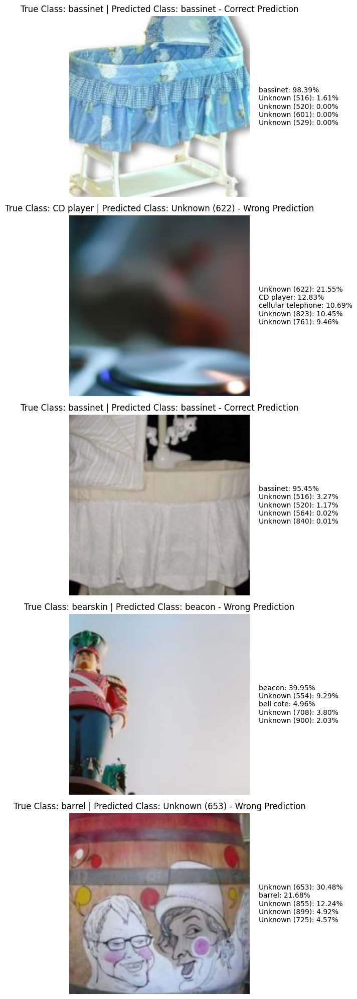


Task 2: FGSM Adversarial Generation

Creating adversarial examples via FGSM...


Generating (ε=0.02): 100%|██████████| 16/16 [00:02<00:00,  6.04it/s]



Max L∞ distance: 0.020000 (should be ≤ 0.02)
Adversarial samples written to /kaggle/working/adversarial_test_set_1.pt

Evaluating on adversarial examples...


Scanning dataset: 100%|██████████| 16/16 [00:00<00:00, 16.11it/s]


Top-1 Accuracy: 5.00%
Top-5 Accuracy: 30.20%
Total evaluated: 500 samples

Accuracy Impact:
Top-1: 70.40% to 5.00% (Drop of 65.40%)
Top-5: 93.20% to 30.20% (Drop of 63.00%)

Visualizing adversarial outcomes...


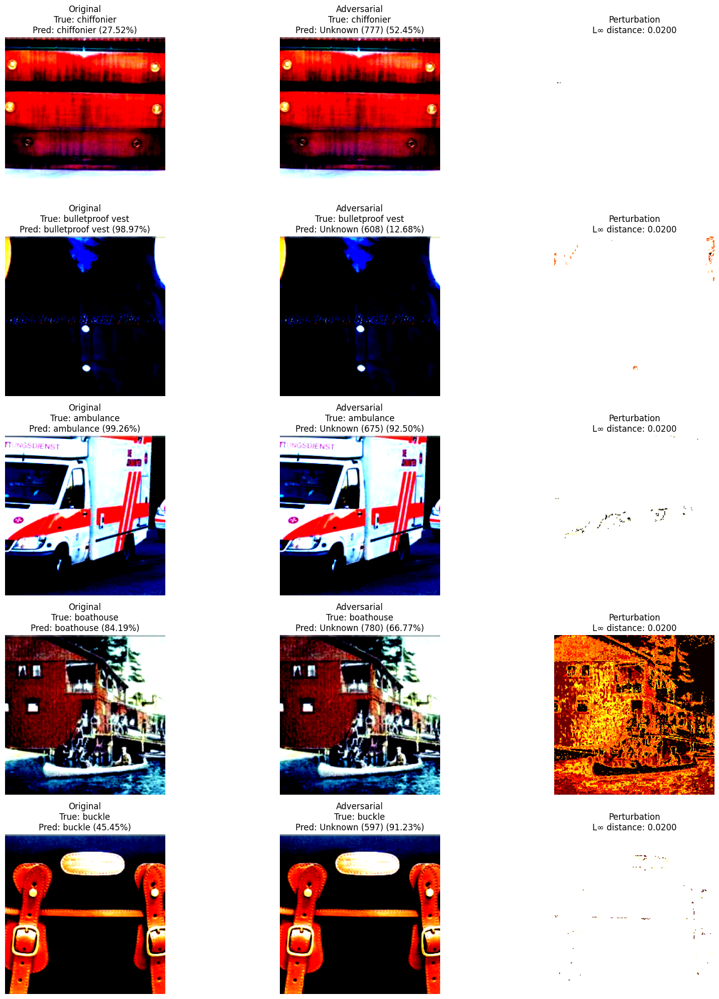


All tasks completed.


In [19]:
def execute_baseline_and_fgsm():
    print("Task 1: Baseline Inference")

    # Initialize model, dataset, preprocessing pipeline, and normalization bounds
    net_model, img_loader, subset_data, label_lookup, norm_mean, norm_std, PIX_MIN, PIX_MAX = initialize_net_and_inputpipe()

    # Evaluate accuracy on clean, unperturbed data
    print("\nEvaluating on unperturbed dataset...")
    acc1_clean, acc5_clean, original_inputs, original_targets = evaluate_topk_accuracy(
        net_model, img_loader, device=device
    )

    # Visualize a few correctly classified clean inputs
    print("\nVisualizing clean predictions...")
    visualize_inference_outputs(
        net_model, original_inputs, original_targets,
        label_lookup, norm_mean, norm_std, sample_count=5
    )

    print("\nTask 2: FGSM Adversarial Generation")
    epsilon = 0.02  # Perturbation bound

    # Generate FGSM adversarial examples
    print("\nCreating adversarial examples via FGSM...")
    fgsm_adversaries = generate_adversarial_batch(
        net_model, original_inputs, original_targets,
        attack_method=perform_fgsm_step,
        epsilon=epsilon,
        device=device
    )

    # Compute and display max L-infinity norm of perturbations
    linf_deviation = calculate_linf_gap(original_inputs, fgsm_adversaries)
    max_perturbation = torch.max(linf_deviation).item()
    print(f"\nMax L∞ distance: {max_perturbation:.6f} (should be ≤ {epsilon})")

    # Save generated adversarial examples to disk
    export_adversarial_tensor(fgsm_adversaries, "/kaggle/working", "adversarial_test_set_1.pt")

    # Evaluate model performance on adversarial examples
    print("\nEvaluating on adversarial examples...")
    adversarial_dataset = torch.utils.data.TensorDataset(fgsm_adversaries, original_targets)
    adversarial_loader = torch.utils.data.DataLoader(adversarial_dataset, batch_size=32, shuffle=False)
    acc1_adv, acc5_adv, _, _ = evaluate_topk_accuracy(net_model, adversarial_loader, device=device)

    # Report accuracy drop due to attack
    acc1_drop = acc1_clean - acc1_adv
    acc5_drop = acc5_clean - acc5_adv
    print("\nAccuracy Impact:")
    print(f"Top-1: {acc1_clean:.2f}% to {acc1_adv:.2f}% (Drop of {acc1_drop:.2f}%)")
    print(f"Top-5: {acc5_clean:.2f}% to {acc5_adv:.2f}% (Drop of {acc5_drop:.2f}%)")

    # Visualize the impact of adversarial perturbations on predictions
    print("\nVisualizing adversarial outcomes...")
    plot_adversarial_differences(
        net_model, original_inputs, fgsm_adversaries, original_targets,
        label_lookup, norm_mean, norm_std, num_samples=5
    )

    print("\nAll tasks completed.")

    # Return clean and adversarial data for downstream evaluation
    return original_inputs, original_targets, fgsm_adversaries


# Execute baseline and FGSM pipeline when run as main script
if __name__ == "__main__":
    execute_baseline_and_fgsm()


Task 1: Baseline Inference
Loading ResNet-34...
Loaded 500 images across 100 folders.

Evaluating on unperturbed dataset...


Scanning dataset: 100%|██████████| 16/16 [00:01<00:00,  9.29it/s]


Top-1 Accuracy: 70.40%
Top-5 Accuracy: 93.20%
Total evaluated: 500 samples

Visualizing clean predictions...


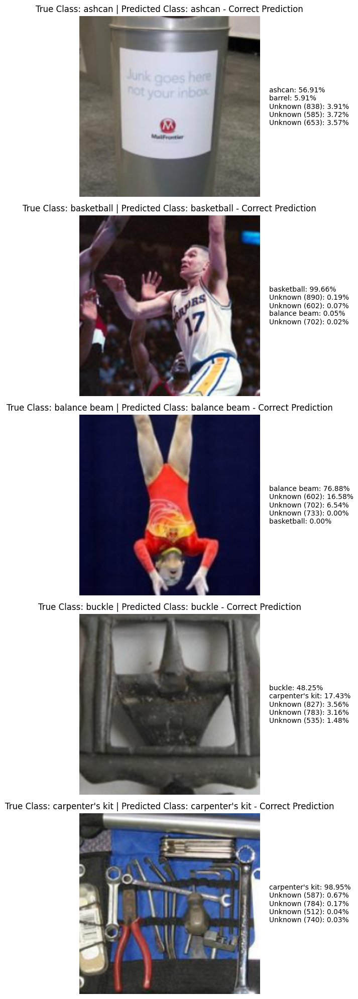


Task 2: FGSM Adversarial Generation

Creating adversarial examples via FGSM...


Generating (ε=0.02): 100%|██████████| 16/16 [00:02<00:00,  6.66it/s]



Max L∞ distance: 0.020000 (should be ≤ 0.02)
Adversarial samples written to /kaggle/working/adversarial_test_set_1.pt

Evaluating on adversarial examples...


Scanning dataset: 100%|██████████| 16/16 [00:01<00:00, 12.55it/s]


Top-1 Accuracy: 5.00%
Top-5 Accuracy: 30.20%
Total evaluated: 500 samples

Accuracy Impact:
Top-1: 70.40% to 5.00% (Drop of 65.40%)
Top-5: 93.20% to 30.20% (Drop of 63.00%)

Visualizing adversarial outcomes...


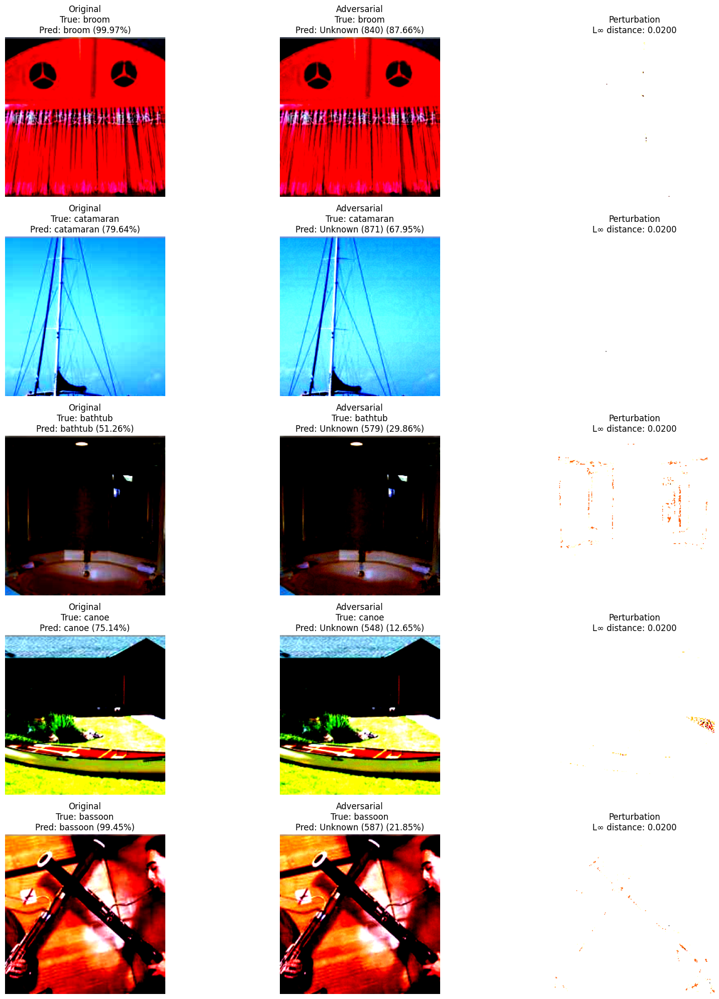


All tasks completed.


In [20]:
all_inputs, all_targets, adv_inputs = execute_baseline_and_fgsm()

## TASK 3


In [21]:
def run_pgd_attack(model_ref, input_batch, target_batch, epsilon=0.02, step_size=0.01, steps=10, device='None'):
    # Perform Projected Gradient Descent (PGD) attack on a batch of inputs

    # Automatically detect model device if not specified
    if device is None:
        device = next(model_ref.parameters()).device

    # Move inputs and targets to the correct device
    input_batch = input_batch.to(device)
    target_batch = target_batch.to(device)

    # Initialize adversarial batch as a detached clone of the input
    adv_batch = input_batch.clone().detach()

    for _ in range(steps):
        # Clear previous gradients if they exist
        if adv_batch.grad is not None:
            adv_batch.grad.zero_()

        # Enable gradient tracking for adversarial inputs
        adv_batch.requires_grad = True

        # Forward pass and compute loss
        logits = model_ref(adv_batch)
        loss = torch.nn.functional.cross_entropy(logits, target_batch)

        # Backpropagate to compute gradients
        model_ref.zero_grad()
        loss.backward()

        # Compute perturbation in the direction of the sign of the gradient
        grad_sign = adv_batch.grad.data.sign()
        with torch.no_grad():
            # Update adversarial example with step size in gradient direction
            adv_batch = adv_batch + step_size * grad_sign

            # Clip perturbation to stay within ε-ball of original input
            perturb = torch.clamp(adv_batch - input_batch, min=-epsilon, max=epsilon)
            adv_batch = input_batch + perturb

            # Clamp to valid input pixel range (after normalization)
            adv_batch = torch.clamp(adv_batch, PIX_MIN, PIX_MAX)

    # Return final adversarial examples, detached from computation graph
    return adv_batch.detach()


In [22]:
def execute_momentum_pgd(net_model, images_clean, labels_true,
                         eps_limit=0.02, step_alpha=0.01, steps=10, momentum=0.9, device='None'):
    # Performs Momentum Iterative FGSM (also known as Momentum PGD) attack
    # Adds a momentum term to stabilize and guide the direction of gradient updates

    # Automatically infer device if not provided
    if device is None:
        device = next(net_model.parameters()).device

    # Move inputs and labels to device
    images_clean = images_clean.to(device)
    labels_true = labels_true.to(device)

    # Initialize adversarial examples and momentum accumulator
    images_adv = images_clean.clone().detach()
    momentum_tracker = torch.zeros_like(images_clean)

    for _ in range(steps):
        # Clear existing gradients
        if images_adv.grad is not None:
            images_adv.grad.zero_()

        # Enable gradient tracking
        images_adv.requires_grad_(True)

        # Forward pass and loss computation
        output = net_model(images_adv)
        loss_val = torch.nn.functional.cross_entropy(output, labels_true)

        # Backward pass to compute gradients
        net_model.zero_grad()
        loss_val.backward()

        # Normalize gradient and update momentum term
        current_grad = images_adv.grad.detach()
        grad_norm = current_grad.abs().mean(dim=(1, 2, 3), keepdim=True) + 1e-8
        momentum_tracker = momentum * momentum_tracker + current_grad / grad_norm

        # Update adversarial image in the direction of accumulated momentum
        images_adv = images_adv + step_alpha * momentum_tracker.sign()

        # Project perturbation back to ε-ball and clamp within valid input range
        clipped_update = torch.clamp(images_adv - images_clean, -eps_limit, eps_limit)
        images_adv = images_clean + clipped_update
        images_adv = torch.clamp(images_adv, PIX_MIN, PIX_MAX)

        # Detach to prevent gradient accumulation
        images_adv = images_adv.detach()

    return images_adv


In [23]:
def execute_targeted_pgd_attack(net_model, img_input, labels_true,
                                eps_bound=0.02, step_alpha=0.01, steps=10,
                                device='None', strategy='least_likely'):
    # Performs a targeted PGD attack aiming to misclassify inputs into specific target classes.
    # Target classes can be chosen randomly or as the least likely prediction by the model.

    # Determine device if not explicitly provided
    if device is None:
        device = next(net_model.parameters()).device

    # Move input images and true labels to target device
    img_input = img_input.to(device)
    labels_true = labels_true.to(device)

    # Select target labels based on the specified strategy
    with torch.no_grad():
        output_logits = net_model(img_input)

        if strategy == 'least_likely':
            # Use the class with lowest predicted probability as the target
            _, labels_target = output_logits.min(dim=1)
        elif strategy == 'random':
            # Randomly select a target label that is different from the true label
            num_classes = output_logits.size(1)
            labels_target = torch.randint(0, num_classes, labels_true.shape, device=device)
            for idx in range(len(labels_true)):
                while labels_target[idx] == labels_true[idx]:
                    labels_target[idx] = torch.randint(0, num_classes, (1,), device=device)
        else:
            raise ValueError(f"Unsupported strategy: {strategy}")

    # Initialize adversarial examples from the clean input
    adv_images = img_input.clone().detach()

    for _ in range(steps):
        # Clear existing gradients if any
        if adv_images.grad is not None:
            adv_images.grad.zero_()

        # Enable gradient computation for adversarial images
        adv_images.requires_grad = True

        # Forward pass and compute loss with respect to target labels
        pred_logits = net_model(adv_images)
        loss_val = torch.nn.functional.cross_entropy(pred_logits, labels_target)

        # Backward pass to compute gradients
        net_model.zero_grad()
        loss_val.backward()
        target_grad = adv_images.grad.data

        with torch.no_grad():
            # Apply gradient descent to move toward the target class
            adv_images = adv_images - step_alpha * target_grad.sign()

            # Project adversarial perturbation back to ε-ball
            constrained_delta = torch.clamp(adv_images - img_input, -eps_bound, eps_bound)
            adv_images = img_input + constrained_delta

            # Clamp pixel values to valid normalized range
            adv_images = torch.clamp(adv_images, PIX_MIN, PIX_MAX)

    return adv_images.detach()


In [25]:
# Dictionary of supported adversarial attack methods and their configurations
# Each entry contains:
# - A human-readable name
# - A lambda function encapsulating the attack with required parameters

attack_methods = {
    "FGSM": {
        "name": "FGSM",
        # Fast Gradient Sign Method: single-step gradient-based perturbation
        "function": lambda m, x, y, eps, d: perform_fgsm_step(m, x, y, epsilon=eps, device=d)
    },
    "PGD-10": {
        "name": "PGD (10 steps)",
        # Projected Gradient Descent with 10 iterations and step size ε/5
        "function": lambda m, x, y, eps, d: run_pgd_attack(m, x, y, epsilon=eps, step_size=eps/5, steps=10, device=d)
    },
    "MIM-10": {
        "name": "Momentum PGD (10 steps)",
        # Momentum Iterative Method: PGD with gradient momentum accumulation
        "function": lambda m, x, y, eps, d: execute_momentum_pgd(m, x, y, eps_limit=eps, step_alpha=eps/5, steps=10, momentum=0.9, device=d)
    },
    "Targeted-PGD-10": {
        "name": "Targeted PGD (10 steps)",
        # PGD targeting a specific class (e.g., least-likely), instead of untargeted attack
        "function": lambda m, x, y, eps, d: execute_targeted_pgd_attack(m, x, y, eps_bound=eps, step_alpha=eps/5, steps=10, device=d)
    }
}


In [26]:
def run_clean_evaluation(net_model, data_loader, device):
    acc_top1, acc_top5, all_inputs, all_targets = evaluate_topk_accuracy(net_model, data_loader, device)
    return acc_top1, acc_top5, all_inputs, all_targets

In [27]:
def evaluate_single_attack(net_model, method_name, attack_fn, clean_inputs, clean_targets,
                           clean_acc_top1, clean_acc_top5, label_lookup, norm_means, norm_stds, device, epsilon):
    # Executes a single adversarial attack and evaluates the resulting accuracy degradation

    print(f"\nRunning: {method_name}")

    # Generate adversarial examples using the provided attack function
    adv_examples = generate_adversarial_batch(
        net_model, clean_inputs, clean_targets,
        attack_method=attack_fn, epsilon=epsilon, device=device
    )

    # Calculate maximum L-infinity distance between clean and adversarial inputs
    linf_stats = calculate_linf_gap(clean_inputs, adv_examples)
    max_linf = torch.max(linf_stats).item()
    print(f"L∞ max: {max_linf:.6f} (ε = {epsilon})")

    # Prepare DataLoader for evaluation on adversarial examples
    adv_data = torch.utils.data.TensorDataset(adv_examples, clean_targets)
    adv_loader = torch.utils.data.DataLoader(adv_data, batch_size=32, shuffle=False)

    # Measure Top-1 and Top-5 accuracy on adversarial data
    acc_adv_top1, acc_adv_top5, _, _ = evaluate_topk_accuracy(net_model, adv_loader, device)

    # Compute accuracy drops
    drop_top1 = clean_acc_top1 - acc_adv_top1
    drop_top5 = clean_acc_top5 - acc_adv_top5

    print(f"Top-1 drop of {drop_top1:.2f}% | From {clean_acc_top1:.2f}% to {acc_adv_top1:.2f}%")
    print(f"Top-5 drop of {drop_top5:.2f}% | From {clean_acc_top5:.2f}% to {acc_adv_top5:.2f}%")

    # Return performance metrics and adversarial samples for further analysis
    return {
        "top1_acc": acc_adv_top1,
        "top5_acc": acc_adv_top5,
        "top1_drop": drop_top1,
        "top5_drop": drop_top5,
        "max_l_inf": max_linf,
        "images": adv_examples
    }


In [28]:
def compare_advanced_attack_methods(net_model, data_loader, dataset_subset, label_lookup,
                                    norm_means, norm_stds, epsilon=0.02, device='None'):
    if device is None:
        device = next(net_model.parameters()).device

    print("\nTask 3: Comparing Stronger Attacks")

    print("\nBaseline evaluation:")
    clean_acc_top1, clean_acc_top5, clean_inputs, clean_targets = run_clean_evaluation(net_model, data_loader, device)

    evaluation_results = {
        "Original": {
            "top1_acc": clean_acc_top1,
            "top5_acc": clean_acc_top5,
            "images": clean_inputs
        }
    }

    for key, method in attack_methods.items():
        result = evaluate_single_attack(
            net_model, method["name"], method["function"],
            clean_inputs, clean_targets,
            clean_acc_top1, clean_acc_top5,
            label_lookup, norm_means, norm_stds,
            device, epsilon
        )
        evaluation_results[key] = result

        if key in ["PGD-10", "MIM-10", "Targeted-PGD-10"]:
            print(f"\nVisualizing examples from {method['name']}")
            plot_adversarial_differences(
                net_model, clean_inputs, result["images"], clean_targets,
                label_lookup, norm_means, norm_stds, num_samples=3
            )

    most_damaging_key = max(
        [k for k in evaluation_results if k != "Original"],
        key=lambda k: evaluation_results[k]["top1_drop"]
    )

    print(f"\nMost Effective Attack: {attack_methods[most_damaging_key]['name']}")
    print(f"Top-1 drop of {evaluation_results[most_damaging_key]['top1_drop']:.2f}%")
    print(f"Top-5 drop of {evaluation_results[most_damaging_key]['top5_drop']:.2f}%")

    export_adversarial_tensor(evaluation_results[most_damaging_key]["images"], "/kaggle/working", "adversarial_test_set_2.pt")
    print("Saved best-performing attack as 'adversarial_test_set_2.pt'")

    return evaluation_results, most_damaging_key


In [29]:
def run_task3_evaluation(net_model,
                         data_loader,
                         dataset_subset,
                         label_lookup,
                         norm_means,
                         norm_stds,
                         epsilon=0.02,
                         device='None'):
    if device is None:
        device = next(net_model.parameters()).device

    return compare_advanced_attack_methods(
        net_model=net_model,
        data_loader=data_loader,
        dataset_subset=dataset_subset,
        label_lookup=label_lookup,
        norm_means=norm_means,
        norm_stds=norm_stds,
        epsilon=epsilon,
        device=device
    )


Task 3: Comparing Stronger Attacks

Baseline evaluation:


Scanning dataset: 100%|██████████| 16/16 [00:01<00:00,  9.45it/s]


Top-1 Accuracy: 70.40%
Top-5 Accuracy: 93.20%
Total evaluated: 500 samples

Running: FGSM


Generating (ε=0.02): 100%|██████████| 16/16 [00:02<00:00,  6.60it/s]


L∞ max: 0.020000 (ε = 0.02)


Scanning dataset: 100%|██████████| 16/16 [00:00<00:00, 17.43it/s]


Top-1 Accuracy: 5.00%
Top-5 Accuracy: 30.20%
Total evaluated: 500 samples
Top-1 drop of 65.40% | From 70.40% to 5.00%
Top-5 drop of 63.00% | From 93.20% to 30.20%

Running: PGD (10 steps)


Generating (ε=0.02): 100%|██████████| 16/16 [00:22<00:00,  1.40s/it]


L∞ max: 0.020000 (ε = 0.02)


Scanning dataset: 100%|██████████| 16/16 [00:00<00:00, 17.61it/s]


Top-1 Accuracy: 0.00%
Top-5 Accuracy: 8.00%
Total evaluated: 500 samples
Top-1 drop of 70.40% | From 70.40% to 0.00%
Top-5 drop of 85.20% | From 93.20% to 8.00%

Visualizing examples from PGD (10 steps)


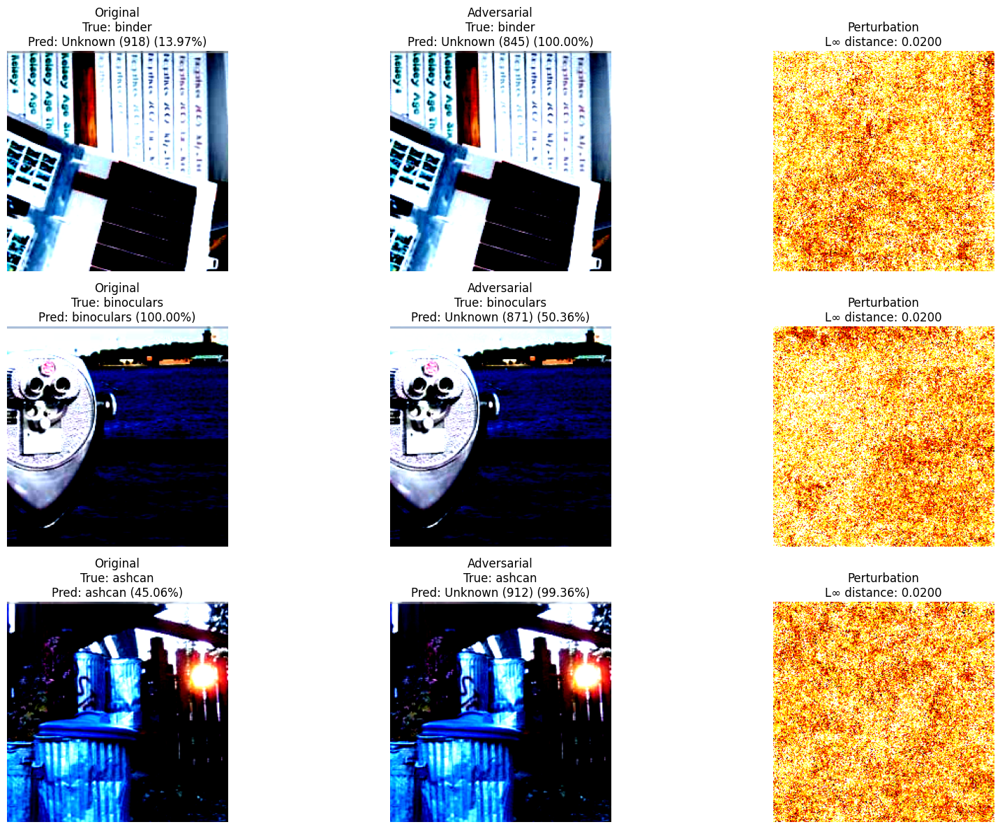


Running: Momentum PGD (10 steps)


Generating (ε=0.02): 100%|██████████| 16/16 [00:22<00:00,  1.41s/it]


L∞ max: 0.020000 (ε = 0.02)


Scanning dataset: 100%|██████████| 16/16 [00:00<00:00, 16.88it/s]


Top-1 Accuracy: 0.20%
Top-5 Accuracy: 7.60%
Total evaluated: 500 samples
Top-1 drop of 70.20% | From 70.40% to 0.20%
Top-5 drop of 85.60% | From 93.20% to 7.60%

Visualizing examples from Momentum PGD (10 steps)


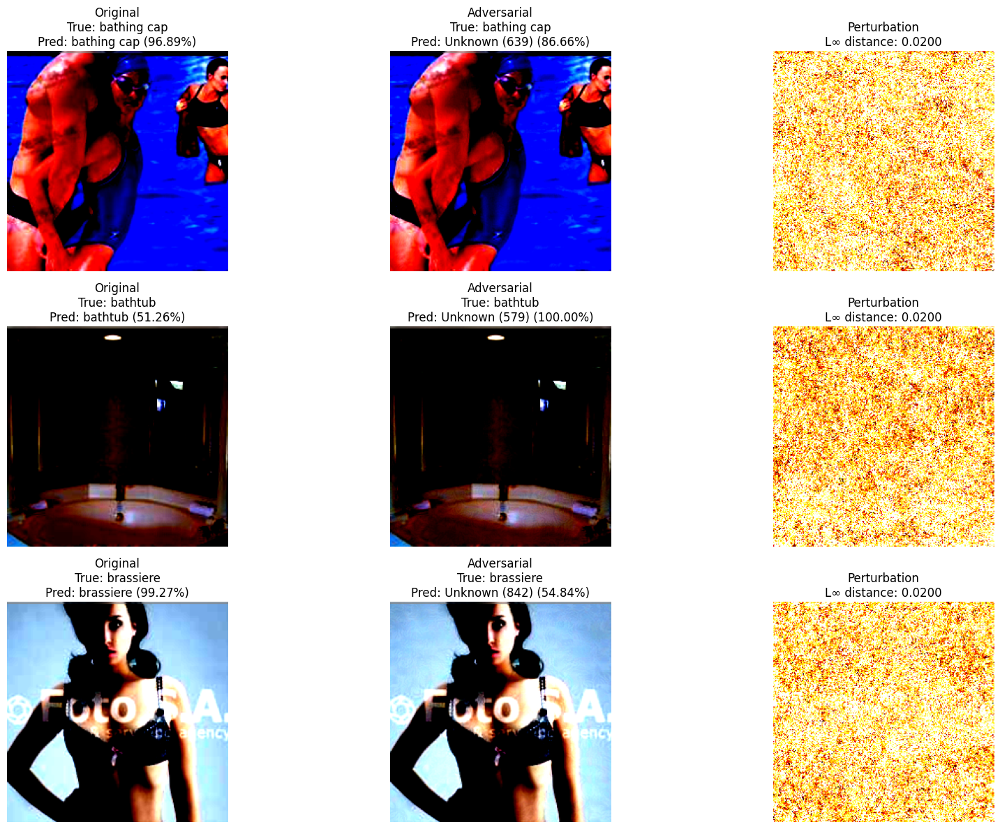


Running: Targeted PGD (10 steps)


Generating (ε=0.02): 100%|██████████| 16/16 [00:23<00:00,  1.47s/it]


L∞ max: 0.020000 (ε = 0.02)


Scanning dataset: 100%|██████████| 16/16 [00:00<00:00, 16.85it/s]


Top-1 Accuracy: 12.60%
Top-5 Accuracy: 27.40%
Total evaluated: 500 samples
Top-1 drop of 57.80% | From 70.40% to 12.60%
Top-5 drop of 65.80% | From 93.20% to 27.40%

Visualizing examples from Targeted PGD (10 steps)


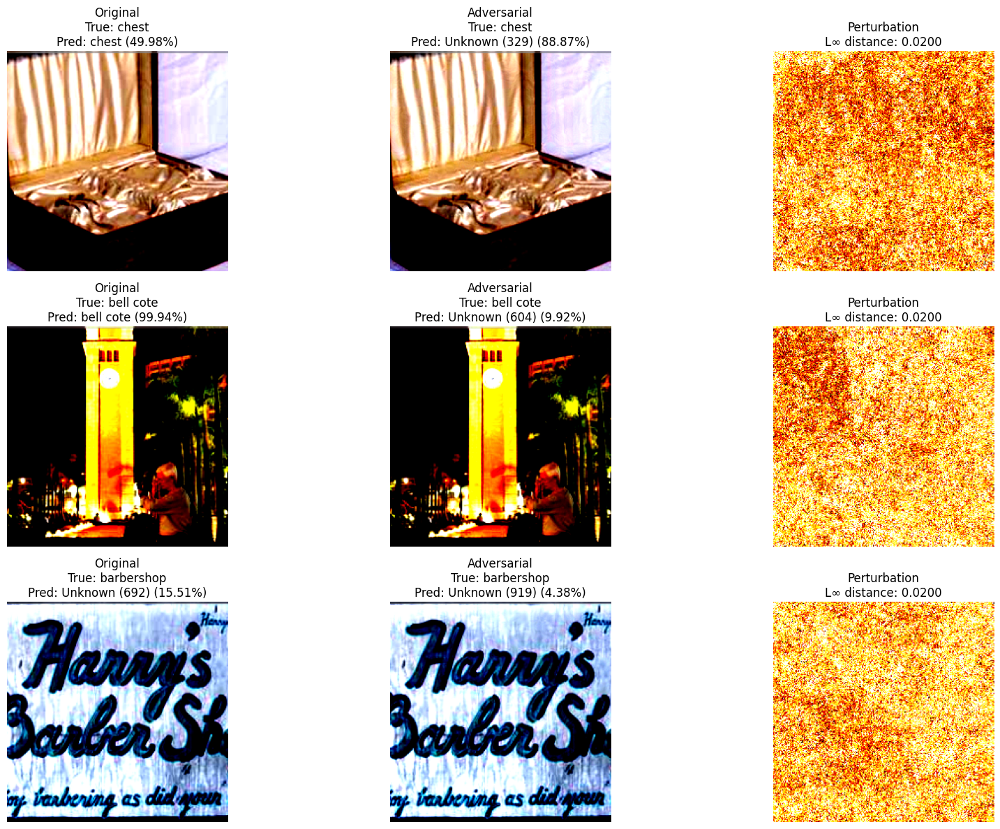


Most Effective Attack: PGD (10 steps)
Top-1 drop of 70.40%
Top-5 drop of 85.20%
Adversarial samples written to /kaggle/working/adversarial_test_set_2.pt
Saved best-performing attack as 'adversarial_test_set_2.pt'
Most successful attack: PGD-10
Top-1 accuracy drop: 70.40%


In [30]:
attack_results, strongest_method = run_task3_evaluation(
    classifier,        # ResNet‑34 instance
    data_iterator,     # DataLoader from earlier
    subset_dataset,    # Folder-based image dataset
    class_labels,      # Mapping from idx to label string
    mean_vals,         # e.g., [0.485, 0.456, 0.406]
    std_vals,          # e.g., [0.229, 0.224, 0.225]
    epsilon=0.02,
    device=device
)

print("Most successful attack:", strongest_method)
print(f"Top-1 accuracy drop: {attack_results[strongest_method]['top1_drop']:.2f}%")


In [31]:
adv_best = attack_results[strongest_method]["images"]

## TASK 4

In [32]:
def apply_patch_gradient_update(delta_tensor, grad_tensor, top_coords, left_coords,
                                input_tensor, patch_dim, epsilon):
    # Applies gradient-based updates only within a localized square patch for each image in the batch

    batch_size = delta_tensor.size(0)

    for i in range(batch_size):
        # Determine patch position for the i-th image
        row, col = int(top_coords[i]), int(left_coords[i])

        # Extract gradient from the specified patch region
        local_gradient_slice = grad_tensor[i, :, row:row + patch_dim, col:col + patch_dim]

        # Update delta tensor (perturbation) using the sign of the gradient
        delta_tensor[i, :, row:row + patch_dim, col:col + patch_dim] += local_gradient_slice.sign()

    # Project perturbation back into the L∞ ε-ball
    delta_tensor.clamp_(-epsilon, epsilon)

    # Ensure perturbed image stays within valid pixel bounds
    delta_tensor = torch.clamp(input_tensor + delta_tensor, PIX_MIN, PIX_MAX) - input_tensor

    # Detach to prevent gradient tracking in future operations
    return delta_tensor.detach()


In [33]:
def apply_localized_pgd_patch(net_model, clean_images, labels_true,
                              epsilon=0.3, step_size=0.05, steps=20, patch_dim=32, device='None'):
    # Performs a patch-based PGD attack: only updates a small localized region (patch) within each image.

    # Automatically select device from model if not provided
    if device is None:
        device = next(net_model.parameters()).device

    # Move data to device
    clean_images = clean_images.to(device)
    labels_true = labels_true.to(device)

    batch_size, _, height, width = clean_images.shape

    # Initialize perturbation tensor (same shape as input) with zeros
    patch_mask = torch.zeros_like(clean_images)

    # For each image, randomly select the top-left corner of the patch
    random_row = torch.randint(0, height - patch_dim + 1, (batch_size,), device=device)
    random_col = torch.randint(0, width - patch_dim + 1, (batch_size,), device=device)

    for _ in range(steps):
        # Enable gradient tracking on the perturbation
        patch_mask.requires_grad_(True)

        # Forward pass using perturbed inputs
        logits = net_model(clean_images + patch_mask)
        loss_val = torch.nn.functional.cross_entropy(logits, labels_true)

        # Backward pass to compute gradients
        net_model.zero_grad()
        loss_val.backward()
        patch_gradient = patch_mask.grad.data

        with torch.no_grad():
            # Apply gradient update to the selected patch region
            patch_mask = patch_mask + step_size * patch_gradient

            # Constrain update within patch and ε-ball using helper
            patch_mask = apply_patch_gradient_update(
                patch_mask, patch_gradient,
                random_row, random_col,
                clean_images, patch_dim, epsilon
            )

    # Return final adversarial images
    return (clean_images + patch_mask).detach()


In [34]:
def batchwise_patched_attack(net_model, img_inputs, img_labels, attack_func,
                             epsilon=0.3, batch_size=32, device='None', **extra_kwargs):
    # Applies a patch-based adversarial attack in batches to avoid memory overload.
    # The attack function should support patch-localized updates (e.g., PGD patch attack).

    # Automatically determine device if not specified
    if device is None:
        device = next(net_model.parameters()).device

    accumulated_adv = []  # Store generated adversarial batches

    # Calculate number of batches (handle remainder with ceiling division)
    total_batches = len(img_inputs) // batch_size + bool(len(img_inputs) % batch_size)

    for batch_idx in tqdm(range(total_batches), desc=f"Patch PGD (ε={epsilon})"):
        lo = batch_idx * batch_size
        hi = min((batch_idx + 1) * batch_size, len(img_inputs))

        # Extract current batch slice
        input_slice = img_inputs[lo:hi]
        label_slice = img_labels[lo:hi]

        # Generate adversarial examples for this mini-batch using provided attack function
        patched_output = attack_func(
            net_model,
            input_slice,
            label_slice,
            epsilon=epsilon,
            device=device,
            **extra_kwargs  # Accepts step_size, patch_dim, steps, etc.
        )

        # Move to CPU and cast to float for consistency
        accumulated_adv.append(patched_output.cpu().float())

    # Concatenate all adversarial batches into a single tensor
    return torch.cat(accumulated_adv)


In [35]:
def evaluate_patch_based_attack(net_model, inputs_clean, true_labels, label_lookup,
                                norm_mean, norm_std, device='None'):
    # Executes a localized PGD patch attack and evaluates its impact on classification performance

    # Auto-detect model device if not provided
    if device is None:
        device = next(net_model.parameters()).device

    print("\nTask 4: Patch-Based Attacks")

    epsilon = 0.5        # Max allowed perturbation magnitude
    patch_dim = 32       # Size of the square patch to be modified

    # Generate adversarial examples using a patch-localized attack strategy
    patched_output = batchwise_patched_attack(
        net_model,
        inputs_clean,
        true_labels,
        attack_func=apply_localized_pgd_patch,
        epsilon=epsilon,
        step_size=epsilon / 5,
        steps=20,
        patch_dim=patch_dim,
        device=device
    )

    # Measure max L-infinity norm between original and adversarial inputs
    max_linf = calculate_linf_gap(inputs_clean, patched_output).max().item()
    print(f"Max L∞ in patch attack: {max_linf:.4f} (should ≤ {epsilon})")

    # Evaluate classification accuracy on the adversarial set
    patch_dataset = torch.utils.data.TensorDataset(patched_output, true_labels)
    patch_loader = torch.utils.data.DataLoader(patch_dataset, batch_size=32, shuffle=False)

    acc_top1, acc_top5, _, _ = evaluate_topk_accuracy(net_model, patch_loader, device=device)
    print(f"Accuracy after patch attack — Top-1: {acc_top1:.2f}%, Top-5: {acc_top5:.2f}%")

    # Visualize clean vs. adversarial outcomes for selected samples
    plot_adversarial_differences(
        net_model, inputs_clean, patched_output, true_labels,
        label_lookup, norm_mean, norm_std, num_samples=5
    )

    # Save generated adversarial samples for reproducibility or transfer evaluation
    export_adversarial_tensor(patched_output, "/kaggle/working", "adversarial_test_set_3.pt")

    return patched_output



Task 4: Patch-Based Attacks


Patch PGD (ε=0.5): 100%|██████████| 16/16 [00:46<00:00,  2.93s/it]


Max L∞ in patch attack: 0.5000 (should ≤ 0.5)


Scanning dataset: 100%|██████████| 16/16 [00:00<00:00, 17.37it/s]


Top-1 Accuracy: 54.20%
Top-5 Accuracy: 76.20%
Total evaluated: 500 samples
Accuracy after patch attack — Top-1: 54.20%, Top-5: 76.20%


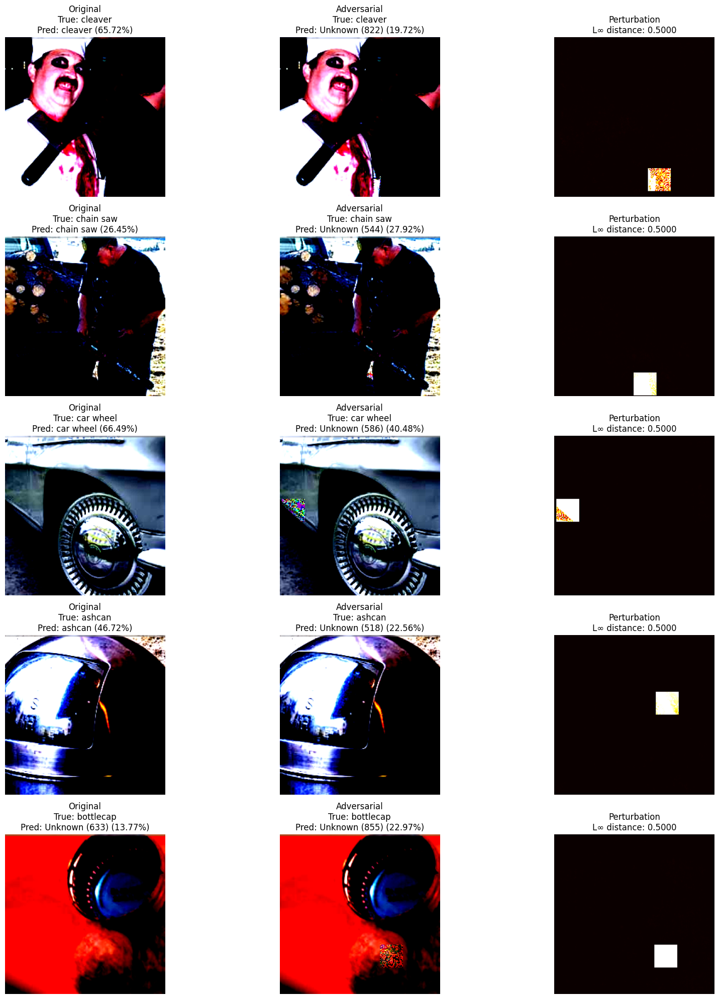

Adversarial samples written to /kaggle/working/adversarial_test_set_3.pt


In [36]:
adv_patch = evaluate_patch_based_attack(
    classifier,
    all_inputs,
    all_targets,
    class_labels,
    mean_vals,
    std_vals,
    device=device
)

In [37]:
# Add Best-Adv results under consistent name for ResNet
attack_results["Best-Adv"] = {
    "top1_acc": attack_results[strongest_method]["top1_acc"],
    "top5_acc": attack_results[strongest_method]["top5_acc"]
}


In [38]:
# Evaluate ResNet on patch attack if not already done
patch_loader = torch.utils.data.DataLoader(
    torch.utils.data.TensorDataset(adv_patch, all_targets),
    batch_size=32,
    shuffle=False
)

patch_top1, patch_top5, _, _ = evaluate_topk_accuracy(classifier, patch_loader, device=device)

attack_results["Patch"] = {
    "top1_acc": patch_top1,
    "top5_acc": patch_top5
}

Scanning dataset: 100%|██████████| 16/16 [00:01<00:00, 15.84it/s]


Top-1 Accuracy: 54.20%
Top-5 Accuracy: 76.20%
Total evaluated: 500 samples


## TASK 5

In [39]:
def evaluate_attack_transferability(clean_inputs, ground_truth, adv_fgsm, adv_best, adv_patch, device='None'):
    # Evaluates how adversarial examples generated for one model (ResNet-34)
    # affect the performance of another model (DenseNet-121), i.e., transferability

    print("\nTask 5: Transferability to New Architecture")

    # Load a pretrained DenseNet-121 model for transfer evaluation
    transfer_model = torchvision.models.densenet121(weights="IMAGENET1K_V1").to(device).eval()

    # Auto-detect device if not explicitly provided
    if device is None:
        device = next(transfer_model.parameters()).device

    # Organize the original and adversarial inputs into labeled variants
    input_variants = {
        "Original": clean_inputs,
        "FGSM": adv_fgsm,
        "Best-Adv": adv_best,
        "Patch": adv_patch,
    }

    xfer_acc_summary = {}  # Dictionary to store Top-1 and Top-5 accuracy for each variant

    # Evaluate each input variant on the alternate model (DenseNet)
    for variant_label, input_tensor_set in input_variants.items():
        variant_data = torch.utils.data.TensorDataset(input_tensor_set, ground_truth)
        variant_loader = torch.utils.data.DataLoader(variant_data, batch_size=32, shuffle=False)

        score1, score5, _, _ = evaluate_topk_accuracy(transfer_model, variant_loader, device=device)
        xfer_acc_summary[variant_label] = (score1, score5)

        # Print per-variant accuracy results
        print(f"{variant_label:>10}: Top-1 = {score1:.2f}%, Top-5 = {score5:.2f}%")

    # Print full transfer performance summary
    print("\nTransfer Accuracy Summary:")
    for variant, (score1, score5) in xfer_acc_summary.items():
        print(f"  {variant:>10} → Top-1: {score1:.1f}%, Top-5: {score5:.1f}%")

    return xfer_acc_summary


In [40]:
transfer_stats = evaluate_attack_transferability(
    all_inputs,                                  # Original inputs
    all_targets,                                 # Ground truth labels
    adv_inputs,                                  # FGSM attack
    attack_results[strongest_method]["images"],  # Best-Adv from Task 3
    adv_patch,                                   # Patch attack
    device=device
)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth



Task 5: Transferability to New Architecture


100%|██████████| 30.8M/30.8M [00:00<00:00, 32.9MB/s]
Scanning dataset: 100%|██████████| 16/16 [00:01<00:00,  8.73it/s]


Top-1 Accuracy: 70.80%
Top-5 Accuracy: 91.20%
Total evaluated: 500 samples
  Original: Top-1 = 70.80%, Top-5 = 91.20%


Scanning dataset: 100%|██████████| 16/16 [00:01<00:00,  8.73it/s]


Top-1 Accuracy: 59.00%
Top-5 Accuracy: 85.00%
Total evaluated: 500 samples
      FGSM: Top-1 = 59.00%, Top-5 = 85.00%


Scanning dataset: 100%|██████████| 16/16 [00:01<00:00,  9.01it/s]


Top-1 Accuracy: 58.60%
Top-5 Accuracy: 86.60%
Total evaluated: 500 samples
  Best-Adv: Top-1 = 58.60%, Top-5 = 86.60%


Scanning dataset: 100%|██████████| 16/16 [00:01<00:00,  8.98it/s]


Top-1 Accuracy: 69.60%
Top-5 Accuracy: 89.60%
Total evaluated: 500 samples
     Patch: Top-1 = 69.60%, Top-5 = 89.60%

Transfer Accuracy Summary:
    Original → Top-1: 70.8%, Top-5: 91.2%
        FGSM → Top-1: 59.0%, Top-5: 85.0%
    Best-Adv → Top-1: 58.6%, Top-5: 86.6%
       Patch → Top-1: 69.6%, Top-5: 89.6%


In [41]:
for k in transfer_stats:
    print(f"{k:>10} - DenseNet: {transfer_stats[k][0]:.2f}% | ResNet: {attack_results.get(k, {}).get('top1_acc', 'N/A')}")


  Original - DenseNet: 70.80% | ResNet: 70.4
      FGSM - DenseNet: 59.00% | ResNet: 5.0
  Best-Adv - DenseNet: 58.60% | ResNet: 0.0
     Patch - DenseNet: 69.60% | ResNet: 54.2


In [42]:
import matplotlib.pyplot as plt

def plot_transfer_accuracy_comparison(attack_results, transfer_results, model_a_name="ResNet-34", model_b_name="DenseNet-121"):
    """
    Compare Top-1 and Top-5 accuracy of two models across different adversarial attacks.
    """
    categories = [k for k in transfer_results.keys() if k in attack_results and "top1_acc" in attack_results[k]]

    top1_resnet = [attack_results[k]["top1_acc"] for k in categories]
    top5_resnet = [attack_results[k]["top5_acc"] for k in categories]
    top1_dense  = [transfer_results[k][0] for k in categories]
    top5_dense  = [transfer_results[k][1] for k in categories]

    # --- Top-1 Accuracy Plot ---
    plt.figure(figsize=(8, 5))
    plt.plot(categories, top1_resnet, marker='o', linestyle='--', color='red', label=f"{model_a_name} Top-1")
    plt.plot(categories, top1_dense, marker='s', linestyle='-', color='blue', label=f"{model_b_name} Top-1")
    plt.title("Top-1 Accuracy Comparison")
    plt.xlabel("Attack Type")
    plt.ylabel("Accuracy (%)")
    plt.ylim(0, 100)
    plt.yticks(range(0, 101, 10))
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("top1_accuracy_comparison.png")
    plt.show()

    # --- Top-5 Accuracy Plot ---
    plt.figure(figsize=(8, 5))
    plt.plot(categories, top5_resnet, marker='o', linestyle='--', color='red', label=f"{model_a_name} Top-5")
    plt.plot(categories, top5_dense, marker='s', linestyle='-', color='blue', label=f"{model_b_name} Top-5")
    plt.title("Top-5 Accuracy Comparison")
    plt.xlabel("Attack Type")
    plt.ylabel("Accuracy (%)")
    plt.ylim(0, 100)
    plt.yticks(range(0, 101, 10))
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("top5_accuracy_comparison.png")
    plt.show()


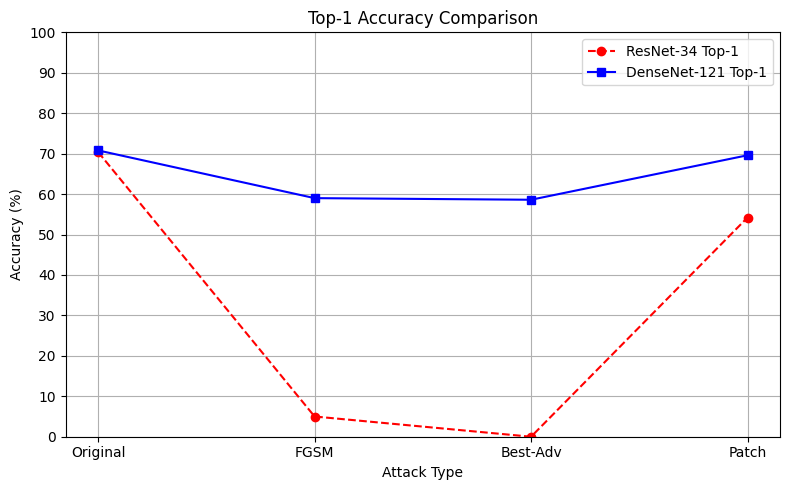

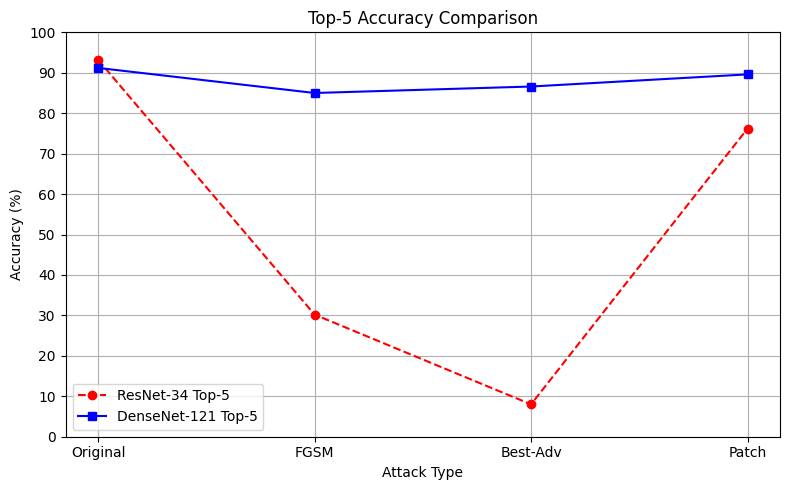

In [43]:
plot_transfer_accuracy_comparison(attack_results, transfer_stats)

## Conclusion

Clean Performance: Both ResNet-34 and DenseNet-121 perform similarly on unperturbed data, with Top-1 accuracies around 70% and Top-5 accuracies above 90%.

FGSM Attack Impact: ResNet-34's performance drops sharply under FGSM — to 5% (Top-1) and 30% (Top-5) — whereas DenseNet-121 remains much more stable, retaining 59% (Top-1) and 85% (Top-5) accuracy.

Stronger Attack Degradation: The Best-Adv attack reduces ResNet-34's Top-1 accuracy to nearly 0% and Top-5 to 8%, showing extreme vulnerability. DenseNet-121 maintains around 58% (Top-1) and 87% (Top-5), with minimal additional loss.

Patch Attack Resilience: DenseNet-121 shows near-complete recovery under patch attacks (Top-1: 69%, Top-5: 90%), while ResNet-34 also improves (Top-1: 53%, Top-5: 76%) but remains less stable.

Model Consistency: Across all attacks, DenseNet-121 maintains relatively stable accuracy, especially in Top-5 predictions, suggesting stronger internal feature generalization and less susceptibility to perturbation.

Architectural Implications: The results suggest that DenseNet-121 is significantly more robust to both pixel-wise and localized adversarial attacks than ResNet-34, making it a more reliable choice in adversarial-prone environments.